In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import cv2 # computer vision 
import seaborn as sns
import pickle
import warnings
warnings.filterwarnings('ignore')


In [2]:
df=pd.read_csv('HR_data.csv')
df.head()

,SLNO,Candidate.Ref,DOJ.Extended,Duration.to.accept.offer,Notice.period,Offered.band,Pecent.hike.expected.in.CTC,Percent.hike.offered.in.CTC,Percent.difference.CTC,Joining.Bonus,Candidate.relocate.actual,Gender,Candidate.Source,Rex.in.Yrs,LOB,Location,Age,Status
0,1,2110407,Yes,14,30,E2,-20.79,13.16,42.86,No,No,Female,Agency,7,ERS,Noida,34,Joined
1,2,2112635,No,18,30,E2,50.00,320.00,180.00,No,No,Male,Employee Referral,8,INFRA,Chennai,34,Joined
2,3,2112838,No,3,45,E2,42.84,42.84,0.00,No,No,Male,Agency,4,INFRA,Noida,27,Joined
3,4,2115021,No,26,30,E2,42.84,42.84,0.00,No,No,Male,Employee Referral,4,INFRA,Noida,34,Joined
4,5,2115125,Yes,1,120,E2,42.59,42.59,0.00,No,Yes,Male,Employee Referral,6,INFRA,Noida,34,Joined


In [60]:
df.replace(['Joined','Not Joined'],[0,1],inplace=True)

In [61]:
# spliting the data into independent and dependent variables
x=df.iloc[:,:-1] # independent 
y=df.iloc[:,-1] # dependent

In [234]:
# Creating dumies
xd=pd.get_dummies(x, drop_first=True) # we will get dumi columns
xd.head()

,SLNO,Candidate.Ref,Duration.to.accept.offer,Notice.period,Pecent.hike.expected.in.CTC,Percent.hike.offered.in.CTC,Percent.difference.CTC,Rex.in.Yrs,Age,DOJ.Extended_Yes,...,Location_Bangalore,Location_Chennai,Location_Cochin,Location_Gurgaon,Location_Hyderabad,Location_Kolkata,Location_Mumbai,Location_Noida,Location_Others,Location_Pune
0,1,2110407,14,30,-20.79,13.16,42.86,7,34,1,...,0,0,0,0,0,0,0,1,0,0
1,2,2112635,18,30,50.00,320.00,180.00,8,34,0,...,0,1,0,0,0,0,0,0,0,0
2,3,2112838,3,45,42.84,42.84,0.00,4,27,0,...,0,0,0,0,0,0,0,1,0,0
3,4,2115021,26,30,42.84,42.84,0.00,4,34,0,...,0,0,0,0,0,0,0,1,0,0
4,5,2115125,1,120,42.59,42.59,0.00,6,34,1,...,0,0,0,0,0,0,0,1,0,0


In [235]:
np.random.seed(1001)
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(xd,y,test_size=0.2)

In [236]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((7196, 36), (1799, 36), (7196,), (1799,))

In [237]:
from sklearn.tree import DecisionTreeClassifier # classifiaction Tree
from sklearn.tree import export_graphviz # visualizting tree

In [238]:
model=DecisionTreeClassifier(criterion='gini',max_depth=None)

In [239]:
# Training the model
model.fit(x_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [240]:
# Roc Curve
y_prob_pred=model.predict_proba(x_test)
y_pred_prob=y_prob_pred[:,1]
y_pred=model.predict(x_test)

In [241]:
from sklearn.metrics import confusion_matrix,classification_report,cohen_kappa_score,roc_auc_score,roc_curve,auc

In [242]:
y_pred_test=model.predict(x_test)
#confussion matrix
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('-'*60)
cr=classification_report(y_test,y_pred_test)
print(cr)
print('-'*60)
kappa_score=cohen_kappa_score(y_test,y_pred_test)
print("Kappa score=",kappa_score)
print("-"*30)
auc_score=roc_auc_score(y_test,y_pred_test)
print("AUC Score=",auc_score)

[[1248  218]
 [ 224  109]]
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.85      0.85      0.85      1466
           1       0.33      0.33      0.33       333

    accuracy                           0.75      1799
   macro avg       0.59      0.59      0.59      1799
weighted avg       0.75      0.75      0.75      1799

------------------------------------------------------------
Kappa score= 0.1798757784474988
------------------------------
AUC Score= 0.5893116854917674


In [243]:
y_test[y_test==2]=0
y_pred_test[y_pred_test==2]=0
fpr,tpr,thresh=roc_curve(y_test,y_pred_test)

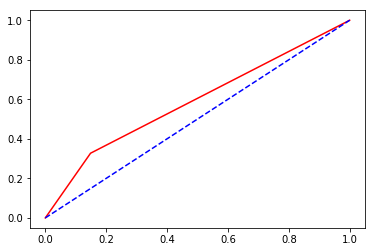

In [244]:
plt.plot(fpr,tpr,'r-')
plt.plot([0,1],[0,1],'b--')
plt.show()

In [245]:
import imblearn
from imblearn.over_sampling import SMOTE

In [246]:
x_resample,y_resample=SMOTE(k_neighbors=6).fit_resample(xd,y)


In [247]:
np.random.seed(1001)
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x_resample,y_resample,test_size=0.2)

In [248]:
model=DecisionTreeClassifier(criterion='gini',max_depth=None)

In [249]:
model.fit(x_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [250]:
# Roc Curve
y_prob_pred=model.predict_proba(x_test)
y_pred_prob=y_prob_pred[:,1]
y_pred=model.predict(x_test)

In [251]:
y_pred_test=model.predict(x_test)
#confussion matrix
cm=confusion_matrix(y_test,y_pred_test)
print(cm)
print('-'*60)
cr=classification_report(y_test,y_pred_test)
print(cr)
print('-'*60)
kappa_score=cohen_kappa_score(y_test,y_pred_test)
print("Kappa score=",kappa_score)
print("-"*30)
auc_score=roc_auc_score(y_test,y_pred_test)
print("AUC Score=",auc_score)

[[1200  263]
 [ 277 1186]]
------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.82      0.82      1463
           1       0.82      0.81      0.81      1463

    accuracy                           0.82      2926
   macro avg       0.82      0.82      0.82      2926
weighted avg       0.82      0.82      0.82      2926

------------------------------------------------------------
Kappa score= 0.6308954203691046
------------------------------
AUC Score= 0.8154477101845522


In [252]:
import pydotplus

In [253]:
export_graphviz(model,out_file='credit.odt',feature_names=pd.DataFrame(x_train).columns,filled=True)

In [254]:
graph=pydotplus.graph_from_dot_file('credit.odt')

In [255]:
graph.write_pdf('credit_tree.pdf')

True

In [256]:
graph.write_jpg('credit_tree.jpg')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.616083 to fit



True

In [257]:
from IPython.display import Image
Image('credit_tree.jpg')

# DEcsion tree

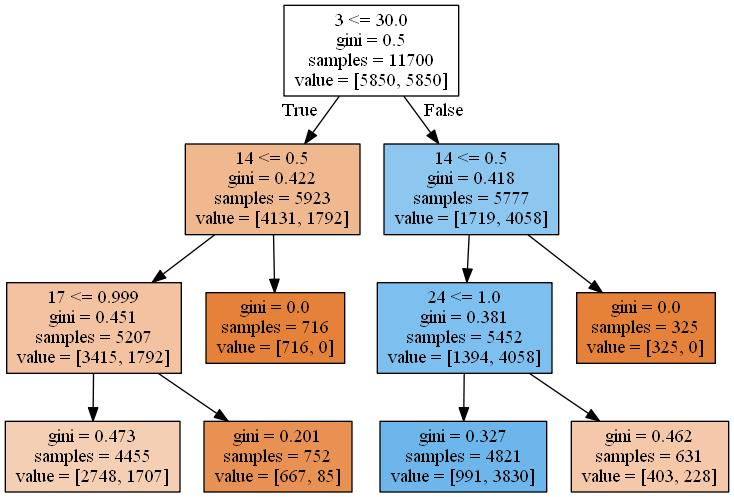

In [258]:
model=DecisionTreeClassifier(criterion='gini',max_depth=3)
model.fit(x_train,y_train)
export_graphviz(model,out_file='credit.odt',feature_names=pd.DataFrame(x_train).columns,filled=True)
graph=pydotplus.graph_from_dot_file('credit.odt')
graph.write_pdf('credit_tree.pdf')
graph.write_jpg('credit_tree.jpg')
Image('credit_tree.jpg')

In [259]:
from  sklearn.model_selection import GridSearchCV # Gridsearch Cross validation

In [260]:
model_tune=DecisionTreeClassifier()

In [261]:
tunned_parameter=[{'criterion':['gini','entropy'],
                   'max_depth':range(2,10)}]

In [262]:
clf=GridSearchCV(model_tune,param_grid=tunned_parameter,cv=10,scoring='roc_auc')
clf.fit(x_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid=[{'criterion': ['gini', 'entropy'],
                          'max_depth': range(2, 10)}],
             pre_dis

In [263]:
clf.best_score_

0.916318065600117

In [264]:
clf.best_params_

{'criterion': 'gini', 'max_depth': 9}

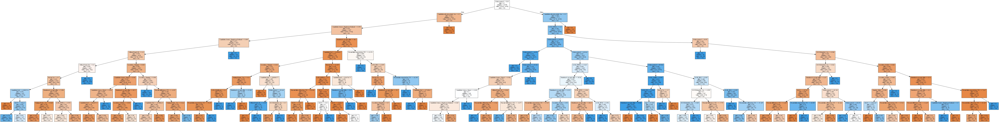

In [270]:

model=DecisionTreeClassifier(criterion='gini',max_depth=9)
model.fit(x_train,y_train)
export_graphviz(model,out_file='credit.odt',feature_names=pd.DataFrame(xd).columns,filled=True, class_names=['No', 'Yes'])
graph=pydotplus.graph_from_dot_file('credit.odt')
graph.write_pdf('credit_tree.pdf')
graph.write_jpg('credit_tree.jpg')
Image('credit_tree.jpg')